**Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание данных**

Файл moscow_places.csv:
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽»;
    * и так далее.
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений;
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число;
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений;
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число;
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    * 0 — заведение не является сетевым;
    * 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

## Шаг 1. Загрузите данные и изучите общую информацию
Загрузите данные о заведениях общественного питания Москвы.
Путь к файлу: /datasets/moscow_places.csv. Скачать датасет.
Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят? 

In [1]:
# импортируем необходимые для работы библиотеки
import pandas as pd
from datetime import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# оборачиваем в конструкцию для запуска локально или с платформы Яндекса
try:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
print(data.head(), '\n')

# Сброс ограничений на количество выводимых рядов
pd.set_option('display.max_rows', None)
 
# Сброс ограничений на число столбцов
pd.set_option('display.max_columns', None)
 
# Сброс ограничений на количество символов в записи
pd.set_option('display.max_colwidth', None)

                   name  category                              address  \
0                WoWфли      кафе           Москва, улица Дыбенко, 7/1   
1        Четыре комнаты  ресторан   Москва, улица Дыбенко, 36, корп. 1   
2                 Хазри      кафе       Москва, Клязьминская улица, 15   
3  Dormouse Coffee Shop   кофейня  Москва, улица Маршала Федоренко, 12   
4             Иль Марко  пиццерия      Москва, Правобережная улица, 1Б   

                          district  \
0  Северный административный округ   
1  Северный административный округ   
2  Северный административный округ   
3  Северный административный округ   
4  Северный административный округ   

                                               hours        lat        lng  \
0                             ежедневно, 10:00–22:00  55.878494  37.478860   
1                             ежедневно, 10:00–22:00  55.875801  37.484479   
2  пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...  55.889146  37.525901   
3             

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод:** Всего в датафрейме представлено 8406 заведений (до обработки дубликатов). Названия в датафрейме понятные, типы данных столбоцов соответствуют содержимому. Есть столбцы с отсутствующими значениями.

## Шаг 2. Выполните предобработку данных
Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [5]:
# проверяем данные на пропуски
print('Пропуски в данных: \n', data.isna().sum(),'\n')

# проверяем данные на дубликаты
print('Количество дубликатов в данных:', data.duplicated().sum(),'\n')

Пропуски в данных: 
 name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64 

Количество дубликатов в данных: 0 



In [6]:
# делаем проверку на неявные дубликаты
print('Количество уникальных названий:', data['name'].nunique())
print('Количество уникальных названий после обработки:', data['name'].str.capitalize().nunique())

# озвращает заглавную версию строки для удаления неявных дубликатов
data['name'] = data['name'].str.capitalize()

Количество уникальных названий: 5614
Количество уникальных названий после обработки: 5512


In [7]:
# заменяем пустые ячейки на 'Нет информации'
data.hours = data.hours.fillna('Нет информации')
data.price = data.price.fillna('Нет информации')
data.avg_bill = data.avg_bill.fillna('Нет информации')

# заменяем пустые ячейки на 0
data.seats = data.seats.fillna(0)

# проверяем данные после изменений
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Создайте столбец street с названиями улиц из столбца с адресом.

In [8]:
# проверим формат записи адреса
print(data.address.head(15))

# напишем функцию для извлечения улицы из столбца с адресом
def extract_street(address: str) -> str:
    parts = []
    for p in address.split(","):
        parts.append(p.strip())
    if len(parts) > 3 and "километр" in parts[2]:
        return ", ".join(parts[1:3])
    else:
        return parts[1]

# применяем функцию к столбцу с адресом
data['street'] = data.address.apply(extract_street)

# проверяем результат добавления столбца
data['street'].head(15)

0                  Москва, улица Дыбенко, 7/1
1          Москва, улица Дыбенко, 36, корп. 1
2              Москва, Клязьминская улица, 15
3         Москва, улица Маршала Федоренко, 12
4             Москва, Правобережная улица, 1Б
5                Москва, Ижорская улица, вл8Б
6       Москва, Клязьминская улица, 9, стр. 3
7       Москва, Клязьминская улица, 9, стр. 3
8     Москва, Дмитровское шоссе, 107, корп. 4
9                 Москва, Ангарская улица, 39
10             Москва, Левобережная улица, 12
11      Москва, улица Маршала Федоренко, 10с1
12             Москва, МКАД, 80-й километр, 1
13       Москва, Базовская улица, 15, корп. 1
14              Москва, Ангарская улица, 42с1
Name: address, dtype: object


0               улица Дыбенко
1               улица Дыбенко
2          Клязьминская улица
3     улица Маршала Федоренко
4         Правобережная улица
5              Ижорская улица
6          Клязьминская улица
7          Клязьминская улица
8           Дмитровское шоссе
9             Ангарская улица
10         Левобережная улица
11    улица Маршала Федоренко
12        МКАД, 80-й километр
13            Базовская улица
14            Ангарская улица
Name: street, dtype: object

### Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
* логическое значение True — если заведение работает ежедневно и круглосуточно;
* логическое значение False — в противоположном случае.

In [9]:
# проверяем формат данных
print(data.hours.head())

# создаем столбец с логичским значением
data['is_24/7'] = data.hours == 'ежедневно, круглосуточно'

data['is_24/7'].head()

0                                  ежедневно, 10:00–22:00
1                                  ежедневно, 10:00–22:00
2    пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00
3                                  ежедневно, 09:00–22:00
4                                  ежедневно, 10:00–22:00
Name: hours, dtype: object


0    False
1    False
2    False
3    False
4    False
Name: is_24/7, dtype: bool

**Вывод:** Дубликатов в датафрейме нет. Неявные дубликаты были устранены. Что касается пропусков, то они есть. Пропуски присутствуют в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.

Столбцы hours, price, avg_bill имеют тип данных object поэтому можно смело заменить их значением 'Нет информации', при дальнейшем анализе легче будет делать выводы, стоит ли опираться на информацию из этого столбца с учетом доли отсутствующей информации.

Столбце seats имеет тип данных float64, поэтому логично заменить пропуски на 0, чтобы было удобнее работать с числовыми данными и в том числе при дальнейшем анализе легче будет делать выводы, стоит ли опираться на информацию из этого столбца с учетом доли отсутствующей информации.

Столбцы middle_avg_bill, middle_coffee_cup оставим без изменений так как в описании к данным присутствует следующая информация: "Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт".

Добавлены столбцы с названием улицы и признаком круглосуточной работы.

## Шаг 3. Анализ данных

### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [10]:
# строим столбчатую диаграмму 
fig = px.bar(data.category.value_counts().reset_index(),
             x='index',
             y='category',
             text='category',
             width=700, 
             height=600
            )
fig.update_layout(title='Количество заведений по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Количество заведений')
fig.update_yaxes(gridwidth=1, gridcolor='LightPink')
fig.show()

**Вывод:** Самая большая доля среди заведений это Кафе. Самую маленьую долю имеют булочные.

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [11]:
# применим метод описательной статистики для просмотра данных
data_seats = data.query('seats > 0').groupby(['category'])['seats'].describe().round(1).reset_index()
data_seats

,category,count,mean,std,min,25%,50%,75%,max
0,"бар,паб",464.0,125.6,145.2,6.0,48.0,84.0,150.0,1288.0
1,булочная,137.0,96.6,98.1,3.0,35.0,52.0,130.0,625.0
2,быстрое питание,331.0,104.3,106.9,1.0,36.0,75.0,150.0,1040.0
3,кафе,1174.0,101.2,118.6,1.0,40.0,60.0,120.0,1288.0
4,кофейня,727.0,114.9,128.3,2.0,40.5,80.0,150.0,1288.0
5,пиццерия,417.0,96.8,112.7,1.0,30.0,56.0,120.0,1288.0
6,ресторан,1250.0,123.9,123.8,2.0,49.0,90.0,155.0,1288.0
7,столовая,159.0,102.9,123.6,4.0,40.0,80.0,120.0,1200.0


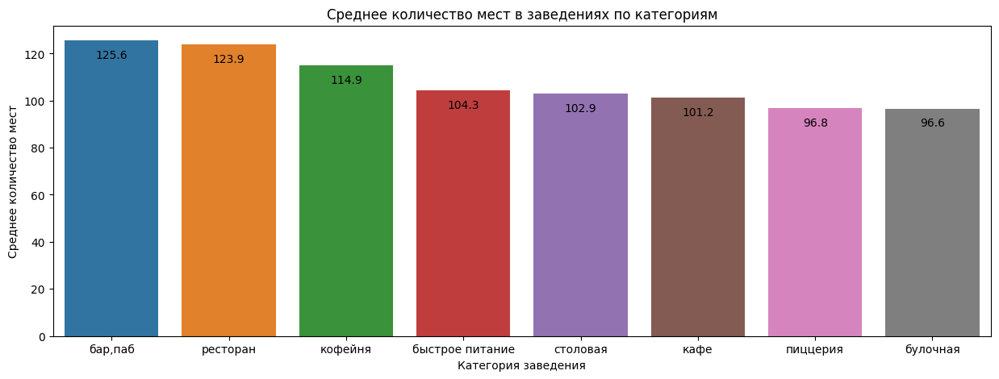

In [12]:
# Построим распределение по среднему количеству мест в заведениях
plt.figure(figsize=(15, 5))
splot = sns.barplot(x='category', y='mean', data=data_seats.sort_values(by='mean', ascending=False), ci=None)
for g in splot.patches:
    splot.annotate(format(g.get_height(), '.1f'),
                   (g.get_x() + g.get_width() / 2., g.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, -13),
                   textcoords = 'offset points')
plt.title('Среднее количество мест в заведениях по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Среднее количество мест')
plt.show()

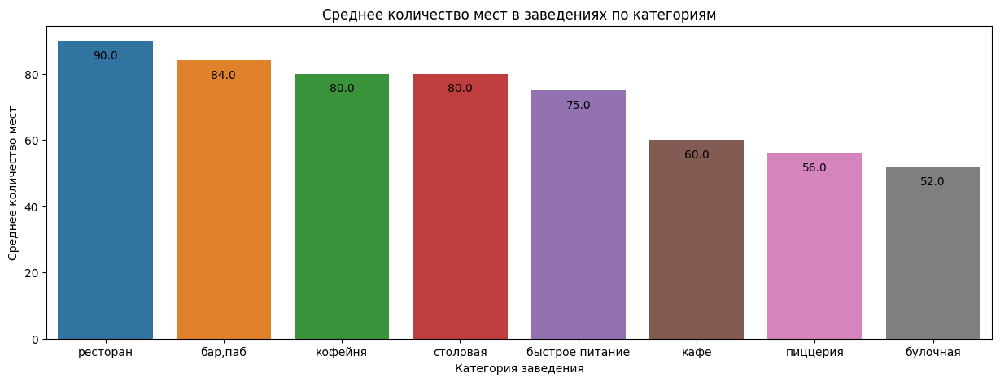

In [13]:
# Построим распределение по среднему количеству мест в заведениях
plt.figure(figsize=(15, 5))
splot = sns.barplot(x='category', y='50%', data=data_seats.sort_values(by='50%', ascending=False), ci=None)
for g in splot.patches:
    splot.annotate(format(g.get_height(), '.1f'),
                   (g.get_x() + g.get_width() / 2., g.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, -13),
                   textcoords = 'offset points')
plt.title('Среднее количество мест в заведениях по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Среднее количество мест')
plt.show()

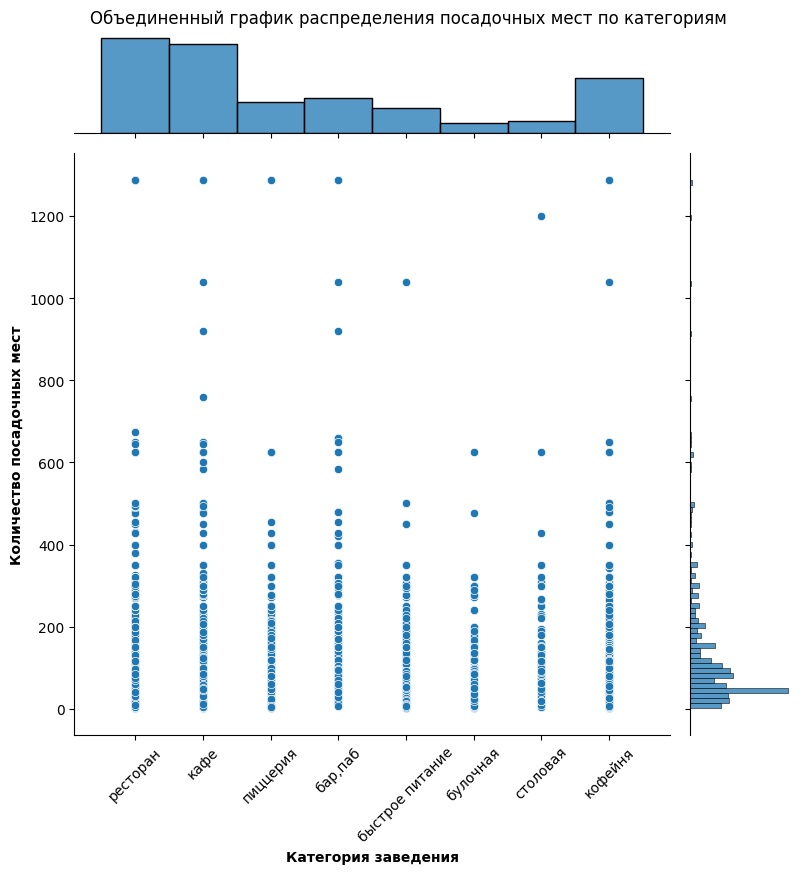

In [14]:
# Построим объединённый график с распределением количества посадочных мест
g = sns.jointplot(x='category', y='seats', data=data.query('seats > 0'), height=8)
for tick in g.ax_joint.get_xticklabels():
    tick.set_rotation(45)
g.set_axis_labels(xlabel='Категория заведения', ylabel='Количество посадочных мест', fontweight='bold')
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle('Объединенный график распределения посадочных мест по категориям')
plt.show()

**Вывод:** Самое большое среднее количество мест имеет категория "Бар,Паб". Если рассматривать медианное количество мест то самое большое количество мест имеет категория "Ресторан", что вполне очевидно, так как зачастую рестораны больше чем бар или паб.
Посмотрев на распределение количества посадочных мест по категориям можно увидеть аномальные значения (всплески в данных), которые повлияли на среднее значение, поэтому при дальнейших выводах лучше ориентироваться на медианное значение.

### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

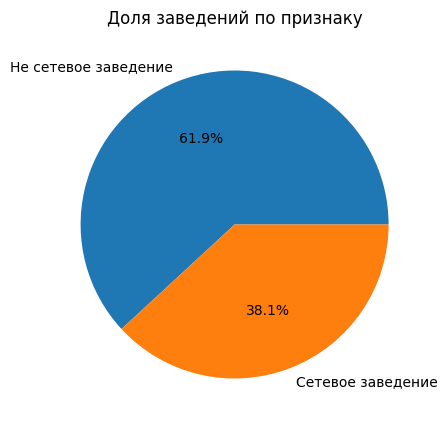

In [15]:
# группируем данные по признаку и считаем количество заведений
data_chain = data.groupby(['chain'], as_index = False)['name'].count()
data_chain.rename(columns = {'name':'count'}, inplace = True)

# постороим график долей заведений по признаку
plt.figure(figsize=(10, 5))
data_chain['count'].plot.pie(labels=['Не сетевое заведение', 'Сетевое заведение'], autopct='%1.1f%%')
plt.title('Доля заведений по признаку')
plt.ylabel(None)
plt.show()

**Вывод:** На графике видно что большую долю занимают Не сетевые заведения - 61,9%.

### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [16]:
# группируем данные
data_cat_chain = data.query('chain == 1').groupby('category', as_index = False)['name'].count()
data_cat_chain['%'] = round((data.query('chain == 1').groupby('category', as_index = False)['name'].count()['name'] / \
    data.groupby('category', as_index = False)['name'].count()['name'] * 100), 1)
print(data_cat_chain.sort_values(by='%', ascending=False).reset_index(drop=True))

# строим столбчатую диаграмму 
fig = px.bar(data_cat_chain.sort_values(by='%', ascending=False),
             x='category',
             y='%',
             text='%',
             width=700, 
             height=600
            )
fig.update_layout(title='Доля сетевых заведений в разрезе категорий, %',
                   xaxis_title='Категория',
                   yaxis_title='Доля заведений')
fig.update_yaxes(gridwidth=1, gridcolor='LightPink')
fig.show()

          category  name     %
0         булочная   157  61.3
1         пиццерия   330  52.1
2          кофейня   720  51.0
3  быстрое питание   232  38.5
4         ресторан   730  35.7
5             кафе   779  32.8
6         столовая    88  27.9
7          бар,паб   169  22.1


**Вывод:** Чаще всего сетевым заведением являются булочные, 61,3% от общего числа заведений в категории. Так же часто встречаются Пиццерии и кофейни, 52,1% и 51% соответственно.

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [17]:
# группируем данные для визуализации
data_chain_15 = (data.query('chain == 1')
                .groupby(['name','category'], as_index = False)['address']
                .count()
                .sort_values(by='address', ascending=False)
                .reset_index(drop=True)
                .head(15)
               )
data_chain_15.rename(columns = {'address':'quantity'}, inplace = True)

# строим столбчатую диаграмму 
fig = px.bar(data_chain_15.sort_values(by='quantity', ascending=True),
             x='quantity',
             y='name',
             text='quantity',
             #hover_data=['category'],
            )
fig.update_layout(title='ТОП-15 сетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведения')
fig.show()

In [18]:
# групируем данные по категории из ТОП-15
data_chain_15.groupby('category')['quantity'].agg({'sum', 'count'}).sort_values(by='count', ascending=False).reset_index()

,category,count,sum
0,кофейня,6,350
1,кафе,3,89
2,ресторан,3,154
3,пиццерия,2,150
4,булочная,1,25


**Вывод:** Из ТОП-15 заведений больше всех заведений имеет Сеть "Шоколадница" - 119 заведений. Из ТОП-15 заведений чаще всего встречаются заведения с категорией кофейня, 6 из 15 заведений.

### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [19]:
# групируем данные по административным районам и категориям заведений
data_dist = (data.groupby(['district','category'])['name']
             .agg({'count'})
             .sort_values(by='count', ascending=False)
             .reset_index()
            )

# строим столбчатую диаграмму 
fig = px.bar(data_dist,
             x='district',
             y='count',
             text='count',
             color='category',
             width=950, 
             height=800
            )
fig.update_layout(title='Количество заведений по районам Москвы в разрезе категорий',
                   xaxis_title='Административный район',
                   yaxis_title='Количество заведений')
fig.update_yaxes(gridwidth=1, gridcolor='LightPink')
fig.show()

**Вывод:** Всего в датасете 9 административных районов. Самое большое количество заведений в Центральном административном округе, что вполне естественно. В остальных общее количество заведений распределено примерно равномерно, кроме Северо-Западного административного округа, там количество заведений меньше всего.

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

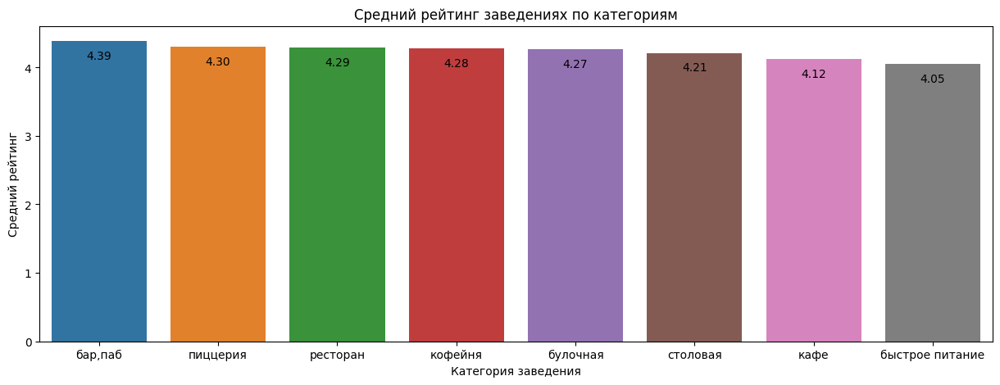

In [20]:
# Группируем данные
data_rat = data.groupby('category', as_index = False)['rating'].mean().sort_values(by='rating', ascending=False)

# Построим распределение по среднему количеству мест в заведениях
plt.figure(figsize=(15, 5))
splot = sns.barplot(x='category', y='rating', data=data_rat, ci=None)
for g in splot.patches:
    splot.annotate(format(g.get_height(), '.2f'),
                   (g.get_x() + g.get_width() / 2., g.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, -13),
                   textcoords = 'offset points')
plt.title('Средний рейтинг заведениях по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.show()

**Вывод:** Усредненные рейтинги не сильно отличаются в зависимости от категории заведения.

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

Ссылка для скачивания geojson: https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson        

In [21]:
# загружаем JSON-файл с границами округов Москвы
# оборачиваем в конструкцию для запуска локально или с платформы Яндекса
try:
    with open(r"C:\Python\admin_level_geomap.geojson", encoding='utf-8') as f:
        state_geo = json.load(f)
except:
    state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# групируем данные по категориям заведений и высчитываем среднее значение
data_rat = data.groupby('district', as_index=False)['rating'].agg('mean')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самый лучший средний рейтинг имеет Центральный округ 4,38

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [22]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [23]:
top_count = 15
streets = data.groupby('street').category.value_counts()
top_streets_index = streets.groupby('street').sum().sort_values(ascending=False).index
top_streets = streets.loc[top_streets_index[:top_count]].reset_index(name='count')

# строим столбчатую диаграмму 
fig = px.bar(top_streets,
             x='street',
             y='count',
             text='count',
             color='category',
             width=950, 
             height=800
            )
fig.update_layout(title='ТОП-15 улиц по количеству заведений с разбивкой по категориям',
                   xaxis_title='Улица',
                   yaxis_title='Количество заведений')
fig.update_yaxes(gridwidth=1, gridcolor='LightPink')
fig.show()

**Вывод:** Больше всего заведений на проспекте Мира - 184 заведения, большая часть это кафе - 53 заведения и рестораны 45 заведений.

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [24]:
# создаем топ 15 улиц по количеству заведений
street = (data.groupby(['street'], as_index = False)['name']
                .count()
                .sort_values(by='name')
                .reset_index(drop=True)
               )
street = street.loc[street['name'] == 1, 'street']

print('Всего', street.count(), 'улиц с одним заведением \n')

# фильтруем основной датафрейм по этим улицам
one_inst = data[data['street'].isin(street)]

one_inst_gp1 = (one_inst.groupby(['category'], as_index = False)['name']
                .count()
                .sort_values(by='name', ascending=False)
                .reset_index(drop=True)
               )
one_inst_gp1.rename(columns = {'name':'quantity'}, inplace = True)
print('Количество заведений по категориям: \n', one_inst_gp1, '\n')

one_inst_gp2 = (one_inst.groupby(['chain'], as_index = False)['name']
                .count()
                .sort_values(by='name', ascending=False)
                .reset_index(drop=True)
               )
one_inst_gp2.rename(columns = {'name':'quantity'}, inplace = True)
print('Количество заведений по призанку сетевое\не сетевое: \n', one_inst_gp2)

Всего 470 улиц с одним заведением 

Количество заведений по категориям: 
           category  quantity
0             кафе       169
1         ресторан        93
2          кофейня        87
3          бар,паб        39
4         столовая        36
5  быстрое питание        23
6         пиццерия        15
7         булочная         8 

Количество заведений по призанку сетевое\не сетевое: 
    chain  quantity
0      0       329
1      1       141


**Вывод:** В основном это несетевые кафе.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [25]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# групируем данные по категориям заведений и высчитываем среднее значение
data_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Самые большие медианные средние чеки в Центральном округе и Западном округе. Самые низкие в Юго-Восточном округе.

In [26]:
data_bill.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


### Соберите наблюдения по вопросам выше в один общий вывод.

1. Самая большая доля среди заведений это Кафе. Самую маленькую долю имеют булочные;
2. Самое большое среднее количество мест имеет категория "Бар,Паб". Если рассматривать медианное количество мест то самое большое количество мест имеет категория "Ресторан", что вполне очевидно, так как зачастую рестораны больше чем бар или паб. Посмотрев на распределение количества посадочных мест по категориям можно увидеть аномальные значения (всплески в данных), которые повлияли на среднее значение, поэтому при дальнейших выводах лучше ориентироваться на медианное значение;
3. Большую долю заведений занимают Не сетевые заведения - 61,9%;
4. Чаще всего сетевым заведением являются булочные, 61,3% от общего числа заведений в категории. Так же часто встречаются Пиццерии и кофейни, 52,1% и 51% соответственно;
5. Из ТОП-15 заведений больше всех заведений имеет Сеть "Шоколадница" - 119 заведений. Из ТОП-15 заведений чаще всего встречаются заведения с категорией кофейня, 6 из 15 заведений;
6. Всего в датасете 9 административных районов. Самое большое количество заведений в Центральном административном округе, что вполне естественно. В остальных общее количество заведений распределено примерно равномерно, кроме Северо-Западного административного округа, там количество заведений меньше всего;
7. Усредненные рейтинги не сильно отличаются в зависимости от категории заведения;
8. Самый лучший средний рейтинг имеет Центральный округ 4,38;
9. Больше всего заведений на проспекте Мира - 184 заведения, большая часть это кафе - 53 заведения и рестораны 45 заведений;
10. Если рассматривать заведения которые находяться единственные на улице, то это в основном несетевые кафе;
11. Самые большие медианные средние чеки в Центральном округе и Западном округе. Самые низкие в Юго-Восточном округе.


## Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.
Ответьте на следующие вопросы:

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [27]:
data_cof = data.query('category == "кофейня"')
print('Всего кофеин в датасете:', data_cof['name'].count())

Всего кофеин в датасете: 1413


In [28]:
# групируем данные по административным районам и категориям заведений
data_cof_gp = (data_cof.groupby('district')['name']
             .agg({'count'})
             .sort_values(by='count', ascending=False)
             .reset_index()
            )

# строим столбчатую диаграмму 
fig = px.bar(data_cof_gp,
             x='district',
             y='count',
             text='count',
             width=950, 
             height=800
            )
fig.update_layout(title='Количество кофеен по районам Москвы',
                   xaxis_title='Административный район',
                   yaxis_title='Количество заведений')
fig.update_yaxes(gridwidth=1, gridcolor='LightPink')
fig.show()

**Вывод:** Всего в датасете 1413 кофеин. 428 кофеин (30%) приходиться на Центральный округ.

### Есть ли круглосуточные кофейни?

In [29]:
print('Количество круглосуточных кофеен:', data_cof.loc[data_cof['is_24/7'] == True, 'name'].count())
print('Доля круглосуточных кофеен:', round(data_cof.loc[data_cof['is_24/7'] == True, 'name'].count() / data_cof['name'].count() * 100),'%')

Количество круглосуточных кофеен: 59
Доля круглосуточных кофеен: 4 %


### Какие у кофеен рейтинги? Как они распределяются по районам?

In [30]:
data_cof['rating'].value_counts()

4.3    261
4.4    228
4.2    202
4.1    170
4.5     95
4.0     78
4.7     77
4.6     61
3.9     38
4.9     37
5.0     37
4.8     29
3.8     25
3.7     19
3.4      9
3.6      7
3.1      7
3.3      7
2.3      4
3.5      4
3.2      4
2.0      3
2.9      3
2.8      3
3.0      2
2.2      1
1.4      1
2.6      1
Name: rating, dtype: int64

In [31]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# групируем данные по категориям заведений и высчитываем среднее значение
data_rat = data_cof.groupby('district', as_index=False)['rating'].agg('mean')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [32]:
data_rat

,district,rating
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


**Вывод:** Ретинг у кофеен в основном от 4.3 до 4.1. Лучший средний рейтинг кофеен в Центральном и Северо-Западном округах 4.3.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [33]:
# группируем данные
data_cof_bill = (data_cof
                 .groupby('district', as_index=False)['middle_coffee_cup']
                 .agg('median')
                 .sort_values(by='middle_coffee_cup', ascending=False)
                )

# строим столбчатую диаграмму 
fig = px.bar(data_cof_bill,
             x='district',
             y='middle_coffee_cup',
             text='middle_coffee_cup',
             width=950, 
             height=800
            )
fig.update_layout(title='Медианная стоимость чашки кофе по районам Москвы',
                   xaxis_title='Административный район',
                   yaxis_title='Медианная стоимость чашки кофе')
fig.update_yaxes(gridwidth=1, gridcolor='LightPink')
fig.show()

Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

**Вывод:** Исходя из выше изложенной информации я бы порекомендовал открыть кофейню в Северном округе и вот почему:
    
    1. Умеренное количество заведений на округ 193, что хорошо для начала бизнеса в плане конкуренции;
    2. Средний рейтинг кофеен на 3 месте среди всех округов, значит есть шансы открыть кофейню с хорошим рейтингом и отнять долю у конкурентов;
    3. Относительно небольшая медианная стоимость чашки кофе 159 рублей, 6 результат среди всех округов. Это хорошо для начала бизнеса, так как стоимость относительно не высокая, это поможет быстро набрать оборот. Плюс в дальнейшем при улучшении рейтинга есть возможность поднять стоимость ради маржи.

## Шаг 5. Подготовка презентации

Подготовьте презентацию исследования для инвесторов. Отвечая на вопросы о московском общепите, вы уже построили много диаграмм, и помещать каждую из них в презентацию не нужно. Выберите важные тезисы и наблюдения, которые могут заинтересовать заказчиков.

Для создания презентации используйте любой удобный инструмент, но отправить презентацию нужно обязательно в формате PDF. Приложите ссылку на презентацию в markdown-ячейке в формате:

Ссылка на презентацию https://cloud.mail.ru/public/UAG4/HdL7Gf6fH